In [2]:
%tensorflow_version 2.x
import tensorflow as tf

In [10]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.utils import plot_model
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

In [4]:
vgg_model = VGG16()

553467904/553467096 [==============================] - 4s 0us/step


In [5]:
vgg_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

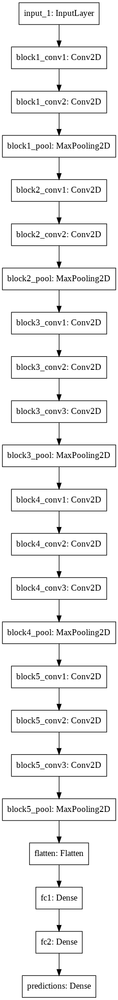

In [7]:
plot_model(vgg_model)

In [8]:
! wget https://www.cruisetradenews.com/wp-content/uploads/2020/01/Amy-Johnson-Front-Quarter.jpg

--2020-08-22 15:23:11--  https://www.cruisetradenews.com/wp-content/uploads/2020/01/Amy-Johnson-Front-Quarter.jpg
Resolving www.cruisetradenews.com (www.cruisetradenews.com)... 172.67.174.169, 104.31.65.193, 104.31.64.193
Connecting to www.cruisetradenews.com (www.cruisetradenews.com)|172.67.174.169|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4676195 (4.5M) [image/jpeg]
Saving to: ‘Amy-Johnson-Front-Quarter.jpg’

Amy-Johnson-Front-Q 100%[===================>]   4.46M  --.-KB/s    in 0.06s   

2020-08-22 15:23:12 (69.4 MB/s) - ‘Amy-Johnson-Front-Quarter.jpg’ saved [4676195/4676195]



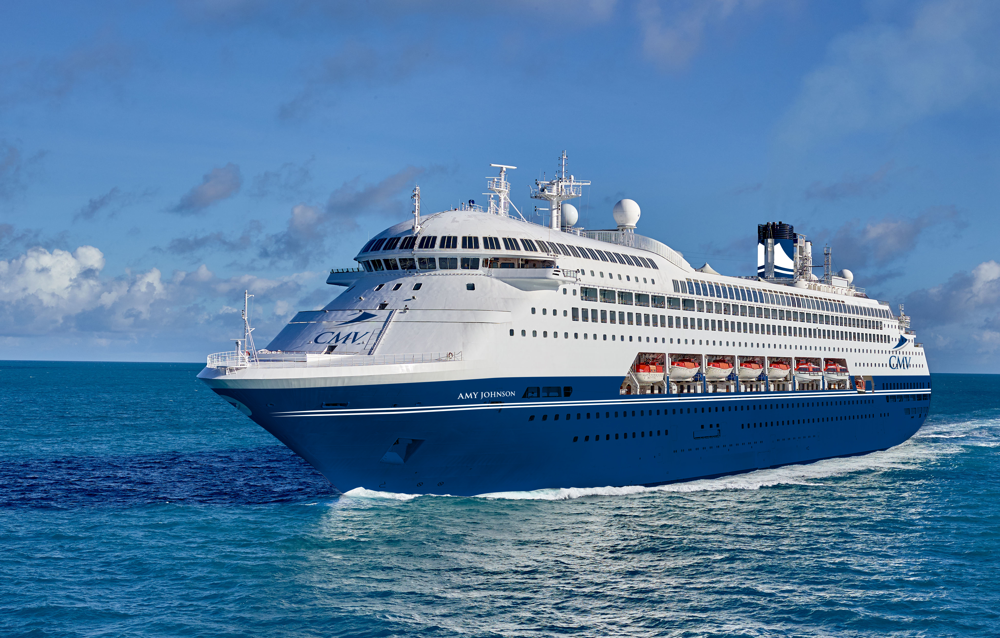

In [11]:
Image.open("Amy-Johnson-Front-Quarter.jpg")

In [12]:
vgg_model.input_shape

(None, 224, 224, 3)

In [29]:
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.applications.vgg16 import decode_predictions

In [19]:
def preprocess_image(filepath):
  image = cv2.imread(filepath)
  image = cv2.resize(image, (224, 224))
  image = preprocess_input(image)
  image = np.expand_dims(image, axis=0)
  return image

In [20]:
test_image = preprocess_image("Amy-Johnson-Front-Quarter.jpg")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


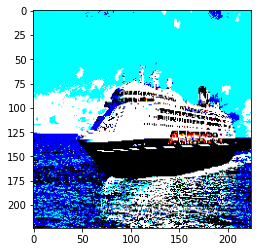

In [21]:
plt.imshow(test_image[0])

In [22]:
test_image.max(), test_image.min()

(151.061, -123.68)

In [30]:
vgg_model.predict(test_image).shape

(1, 1000)

In [25]:
decode_predictions(vgg_model.predict(test_image))

40960/35363 [==================================] - 0s 0us/step


[[('n03673027', 'liner', 0.93505967),
  ('n04606251', 'wreck', 0.02549201),
  ('n09428293', 'seashore', 0.015471833),
  ('n03095699', 'container_ship', 0.008339872),
  ('n03216828', 'dock', 0.006659946)]]

In [ ]:
# How to tackel Dog Breed Identification problem 
# - You teach your model how dogs look like ( Your CNN learns the high level features of dog )
# - Second, you go deep in dog and try to sperate dogs on basis of breeds 

In [26]:
# When you have open domain problem - Then we use VGG directly 
# When you are dealing with specific use cases or closed domain problem  - 
  # Then we will use Transfer Learning 
  # We use big models like VGG, ResNet to learn the high level features of your object in images
  # On top of it you remove the Dense layers of VGG (because they have 1000 layers in last layer)
  # and you put your own layers (CNN/Dense)

In [47]:
# RUN TO SEE ALL 1000 CATEGORIES IN VGG 
# for cat in decode_predictions(np.ones((1, 1000)), top=1000)[0]:
#   print(cat[1])

In [ ]:
### VGG16

![vgg16-1[1].png](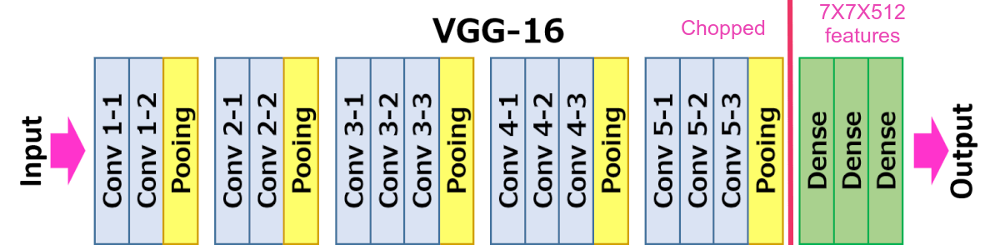)

![1_xGpYptYPEqGl6gWr6bHZEQ[1].png](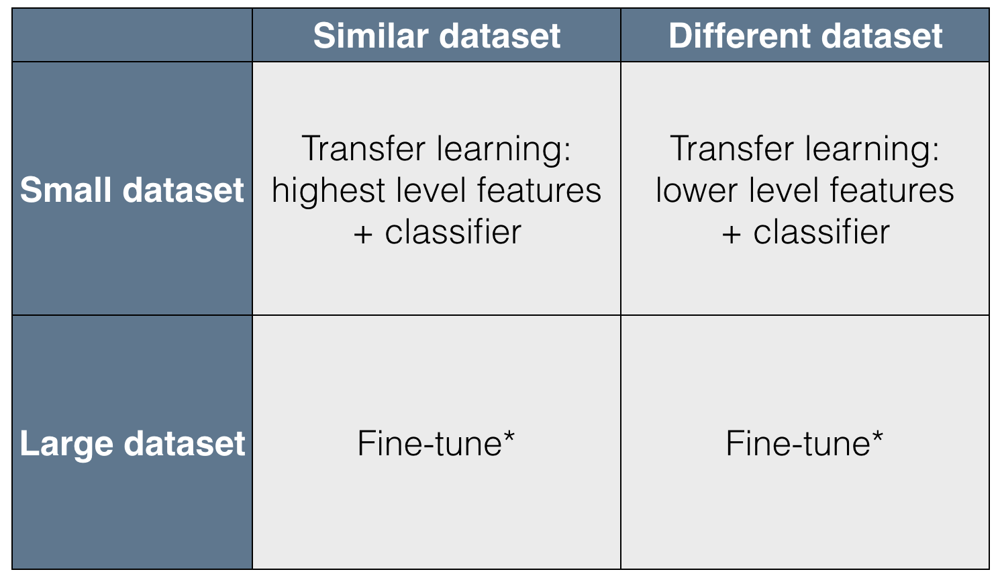)

In [48]:
! wget https://thumbor.forbes.com/thumbor/fit-in/1200x0/filters%3Aformat%28jpg%29/https%3A%2F%2Fspecials-images.forbesimg.com%2Fimageserve%2F5d35eacaf1176b0008974b54%2F0x0.jpg

--2020-08-22 16:26:37--  https://thumbor.forbes.com/thumbor/fit-in/1200x0/filters%3Aformat%28jpg%29/https%3A%2F%2Fspecials-images.forbesimg.com%2Fimageserve%2F5d35eacaf1176b0008974b54%2F0x0.jpg
Resolving thumbor.forbes.com (thumbor.forbes.com)... 151.101.2.49, 151.101.66.49, 151.101.130.49, ...
Connecting to thumbor.forbes.com (thumbor.forbes.com)|151.101.2.49|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 69455 (68K) [image/jpeg]
Saving to: ‘https:%2F%2Fspecials-images.forbesimg.com%2Fimageserve%2F5d35eacaf1176b0008974b54%2F0x0.jpg’

https:%2F%2Fspecial 100%[===================>]  67.83K  --.-KB/s    in 0.01s   

2020-08-22 16:26:38 (4.48 MB/s) - ‘https:%2F%2Fspecials-images.forbesimg.com%2Fimageserve%2F5d35eacaf1176b0008974b54%2F0x0.jpg’ saved [69455/69455]



In [49]:
# 7X7X512 becasue you gave a image of 224X224X3